In [9]:
import numpy as np


c =np.corrcoef(recording)
c.shape

upper_tri_indices = np.triu_indices(c.shape[0], k=1)
row_col = [(i,j) for i,j in zip(*upper_tri_indices)]
upper_tri = c[upper_tri_indices]
upper_tri.shape

(74305,)

False

In [73]:
((386*386)-386)/2


74305.0

In [9]:
import pandas as pd
import numpy as np

def get_corr(phys_rec, s_obj, cond : str|None = None):
    corr_phases = s_obj.analysis_settings['corr_phases']
    #save the indexes of the upper triangle of the correlation matrix
    upper_tri_idxs = np.triu_indices(phys_rec.shape[0], k=1)
    row_col = [(i,j) for i,j in zip(*upper_tri_idxs)]
    corr_df = pd.DataFrame({'row_col': row_col})
    for phase in corr_phases:
        stim_rec = s_obj.get_recording(stim_name = phase, stim_time = None,cond = cond, phys_rec = phys_rec)
        corr_mat = np.corrcoef(stim_rec)
        corr_vec = corr_mat[upper_tri_idxs]
        corr_df[phase] = corr_vec
    s_obj.data[cond]['corr'] = corr_df


In [12]:
s_obj.data[cond]['corr'].describe()

,all,initial gray,final gray,spontaneous,stim,gray,stim_gray
count,74305.000000,74305.000000,74305.000000,74305.000000,74305.000000,74305.000000,74305.000000
mean,0.069828,0.071400,0.103328,0.079064,0.059183,0.070959,0.069328
std,0.062447,0.085261,0.087129,0.090851,0.068482,0.064226,0.063090
min,-0.371143,-0.463447,-0.293491,-0.642060,-0.392239,-0.484124,-0.364395
25%,0.030850,0.020556,0.045511,0.025483,0.017654,0.031197,0.029918
50%,0.062890,0.063671,0.091261,0.072450,0.052661,0.063946,0.062304
75%,0.100543,0.112777,0.147294,0.124083,0.092808,0.102561,0.100121
max,0.842389,0.940244,0.908446,0.900977,0.844524,0.882713,0.869968


In [10]:
phase = 'stim'
phys_rec = recording
s_obj= stim_data
cond = 'pre'
get_corr(phys_rec, s_obj, cond)



In [75]:
len(corr_vec)

74305

In [61]:
import random


r = random.randint(0, len(row_col))
print(r)

c[upper_tri_indices[0][r],upper_tri_indices[1][r]] == c[row_col[r]]


51213


True

In [19]:
row_col = [(i,j) for i,j in zip(*upper_tri_indices)]

In [21]:
upper_tri_indices

(array([  0,   0,   0, ..., 383, 383, 384]),
 array([  1,   2,   3, ..., 384, 385, 385]))

In [23]:
row_col[-3]

(383, 384)

In [10]:
stim_rec = stim_data.get_recording(stim_name = 'spontaneous', stim_time = None,cond = 'pre', phys_rec = recording)

In [11]:
stim_rec.shape

(386, 7208)

In [ ]:
def compute_correlation(Fluorescence, logical_dict):
  def costruisci_timeseries_spezzata(Fluorescence,intervalli_logical_dict):
    numero_colonne_ts_spezzata = intervalli_logical_dict[:, 1] - intervalli_logical_dict[:, 0] + 1

    # Inizializza la nuova matrice con zeri
    ts_spezzata = np.zeros((Fluorescence.shape[0], np.sum(numero_colonne_ts_spezzata)))

    # Copia le colonne appropriate dalla matrice originale nella nuova matrice
    indice_colonna_ts_spezzata = 0
    for row in range(intervalli_logical_dict.shape[0]):
        start, end = intervalli_logical_dict[row]
        ts_spezzata[:, indice_colonna_ts_spezzata:indice_colonna_ts_spezzata + (end - start + 1)] = Fluorescence[:, start:end + 1]
        indice_colonna_ts_spezzata += (end - start + 1)
    return ts_spezzata 


  keys_of_interest = ['initial gray', 'final gray','+','gray +']
  nr_cells = Fluorescence.shape[0]
  correlation_tensor = np.zeros((len(keys_of_interest)+1,nr_cells,nr_cells))
  correlation_tensor[0,:,:] = np.corrcoef(Fluorescence)

  for idx,key in enumerate(keys_of_interest):
    if key=='initial gray' or key=='final gray':
      timeseries_of_interest = Fluorescence[:,logical_dict[key]] 
    else:
      if key=='+':
        other_key = '-'
      else:
        other_key = 'gray -'
      intervalli1 = logical_dict[key]
      intervalli2 = logical_dict[other_key]
      intervalli = np.concatenate((intervalli1, intervalli2), axis=0)
      intervalli = intervalli[intervalli[:,0].argsort()]
      timeseries_of_interest = costruisci_timeseries_spezzata(Fluorescence,intervalli)
    correlation_tensor[idx+1,:,:] = np.corrcoef(timeseries_of_interest)
  return correlation_tensor


/home/lorenzo/Documents/GitHub/V1_gratings/scripts
270+ is missing
gray 270+ is missing
Error in plotting 270+ psi


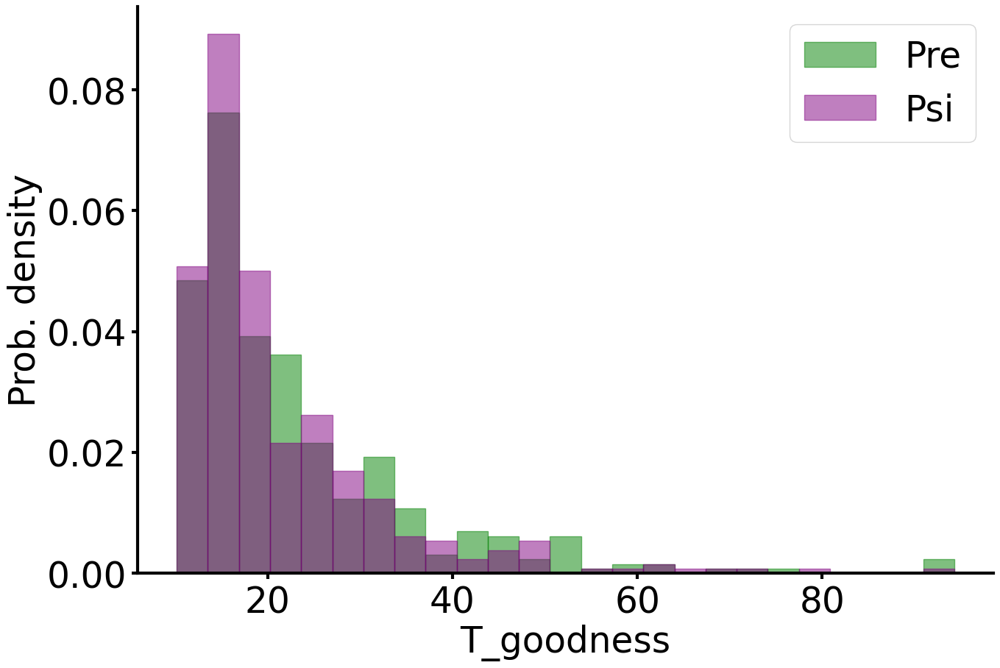

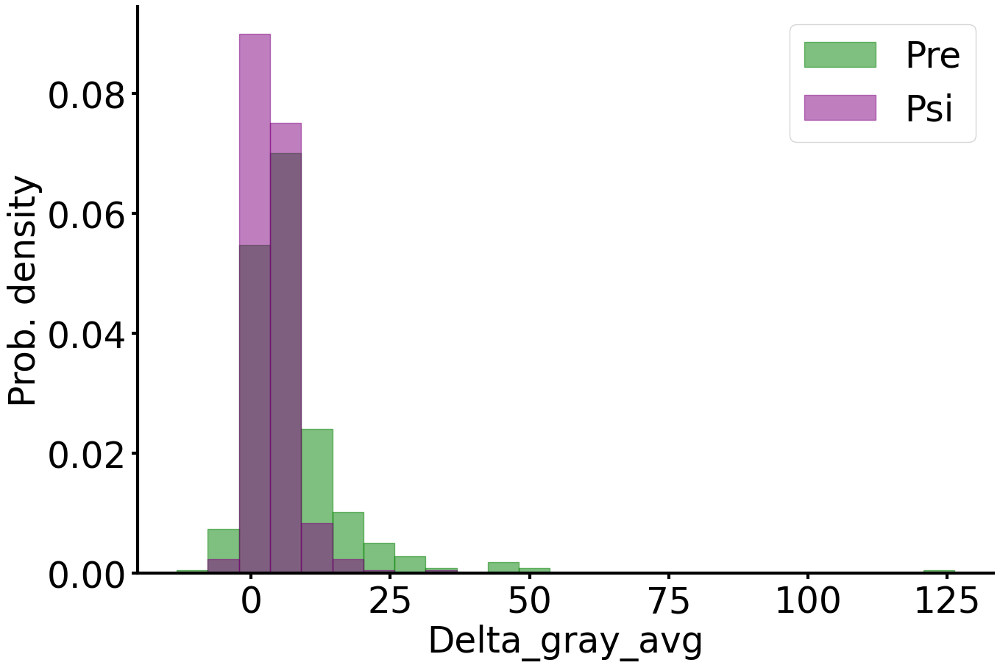

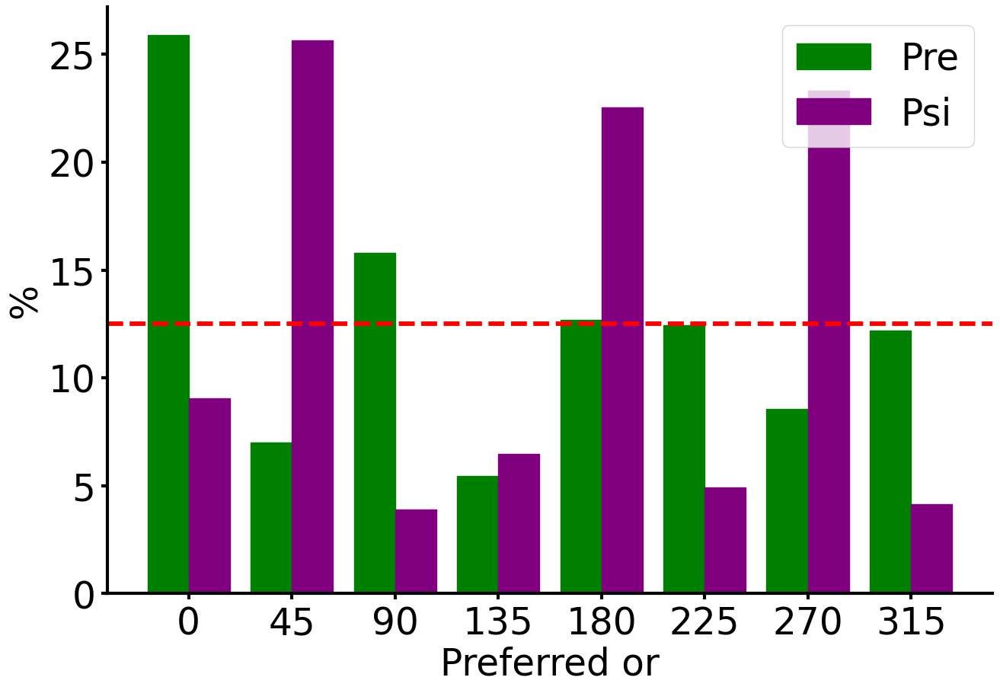

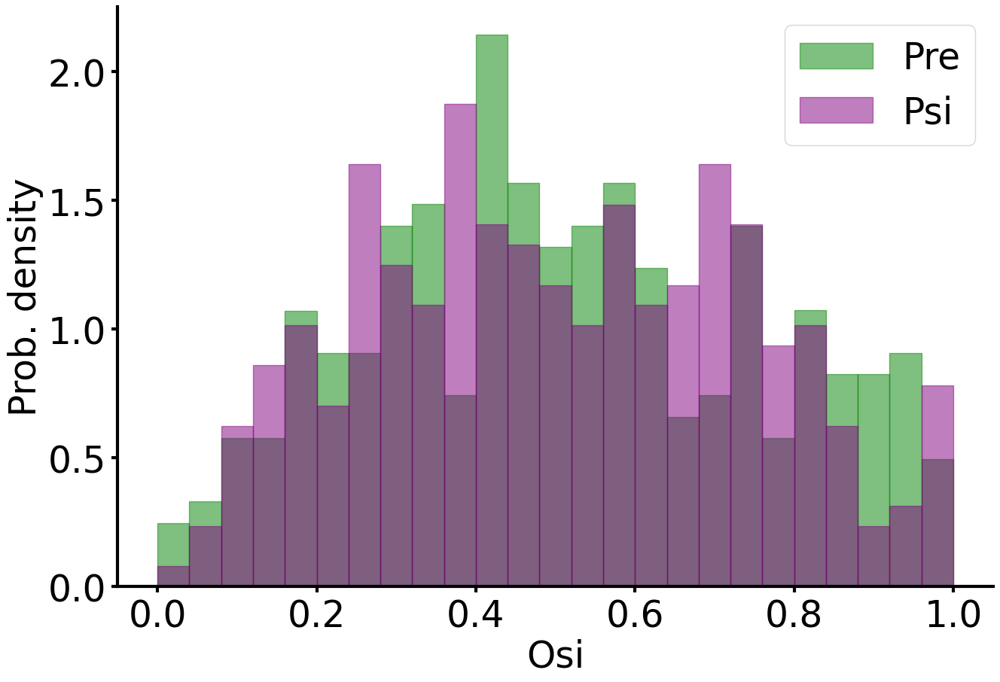

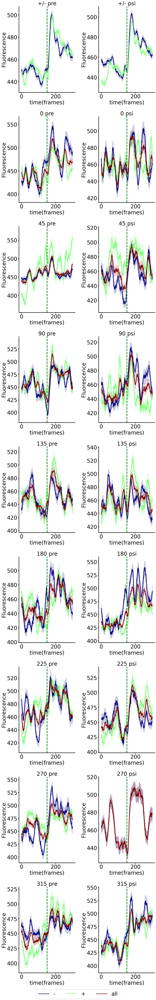

Error in plotting 270+ psi


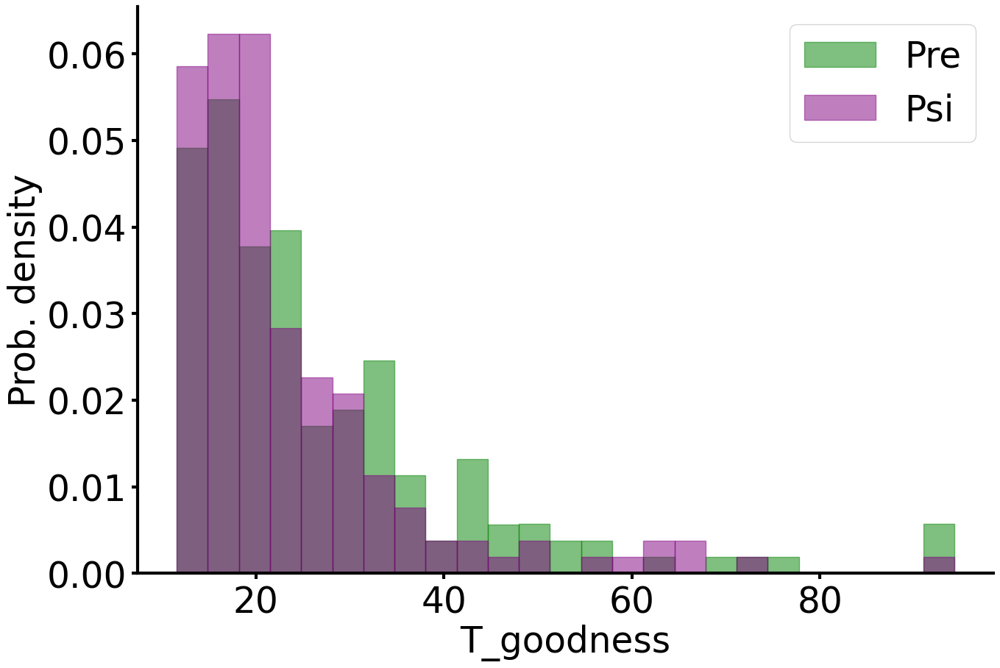

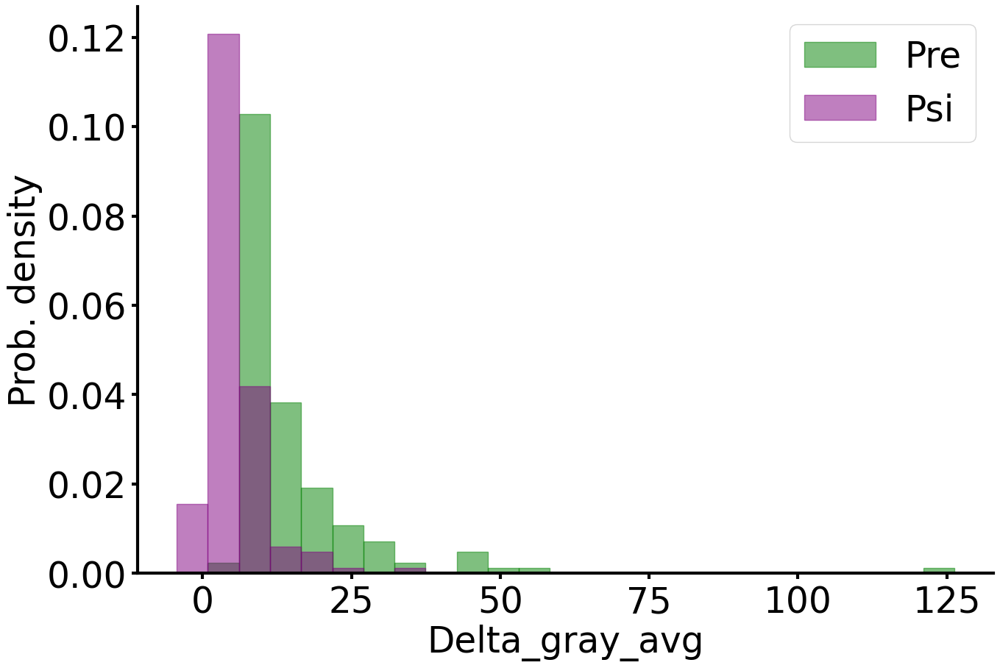

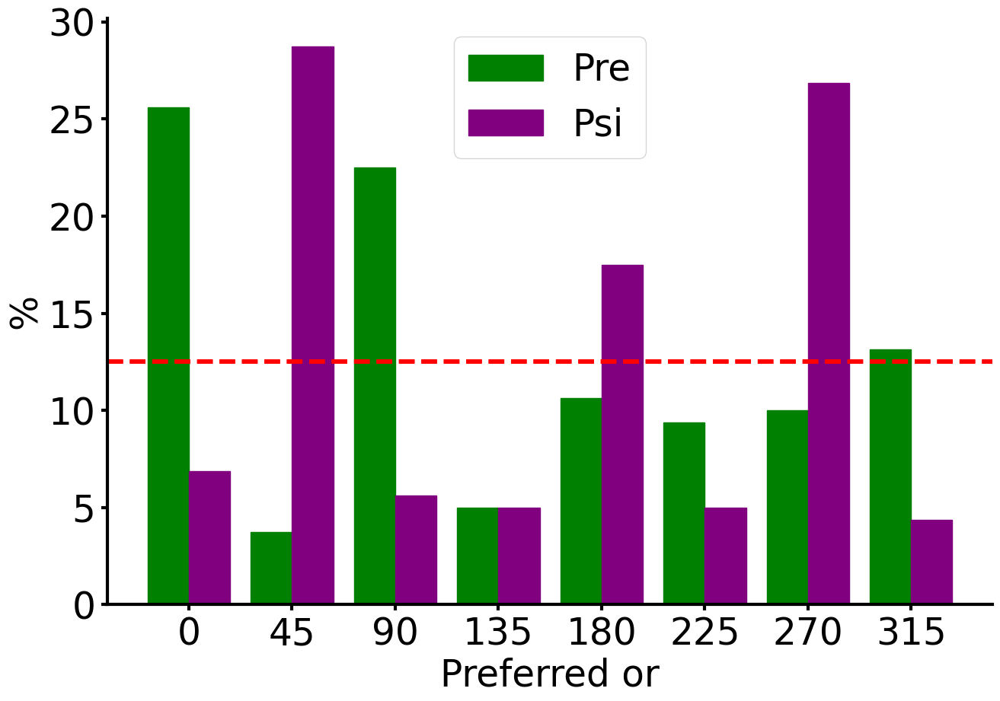

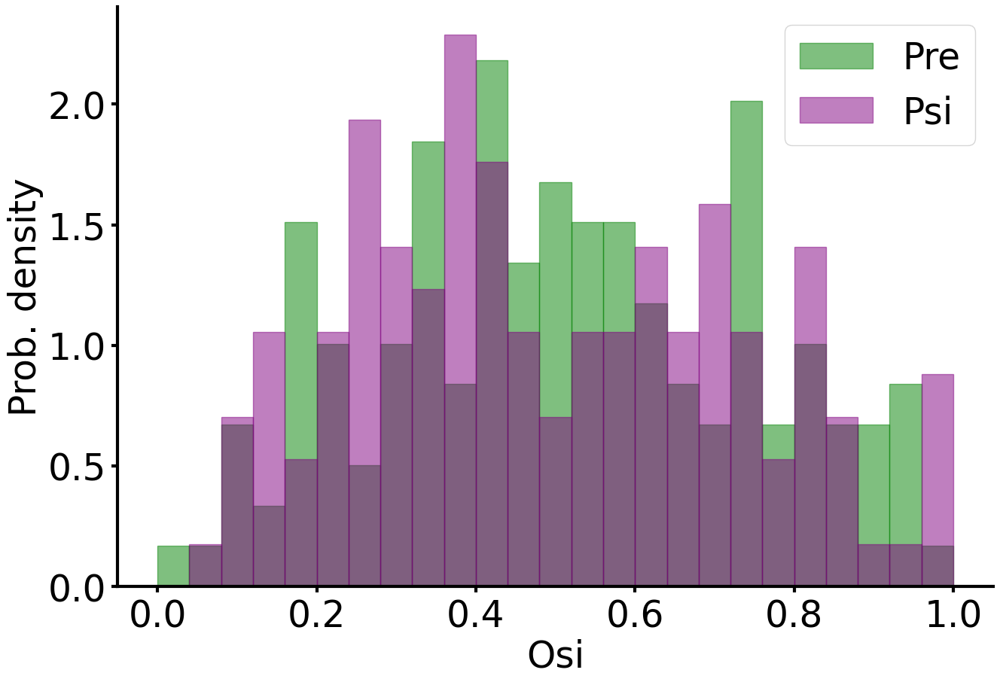

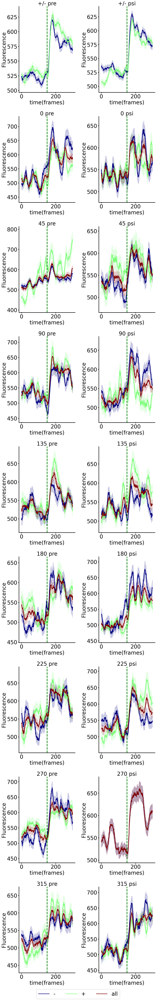

Error in plotting 270+ psi


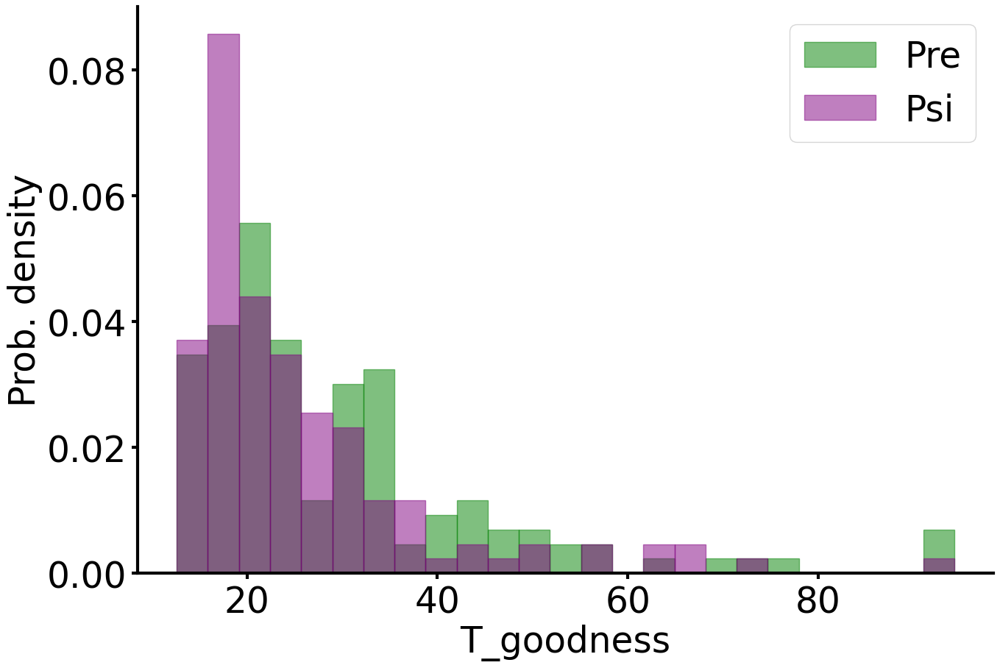

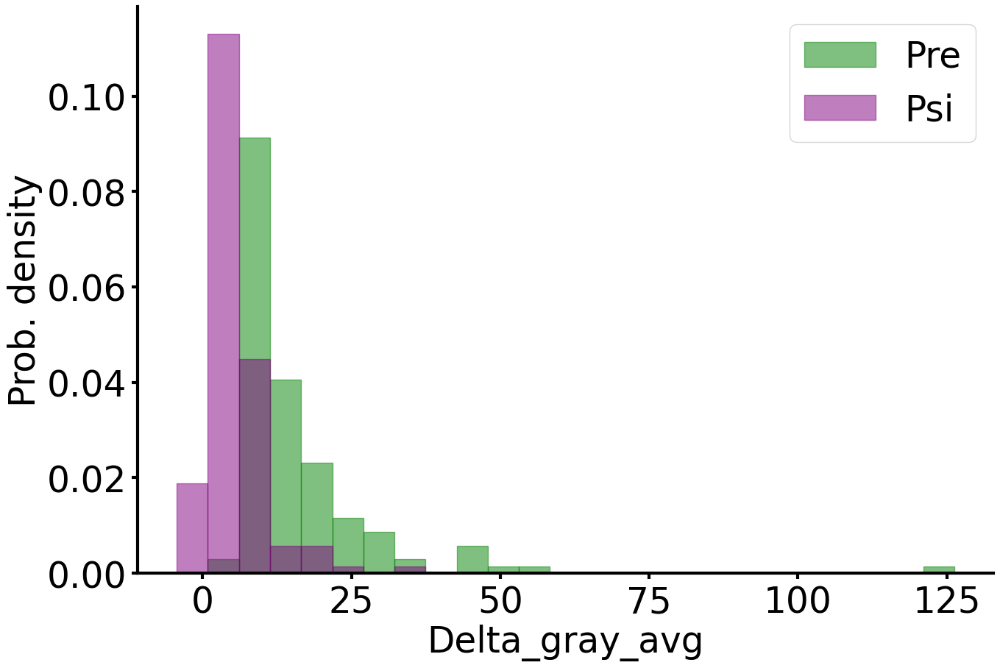

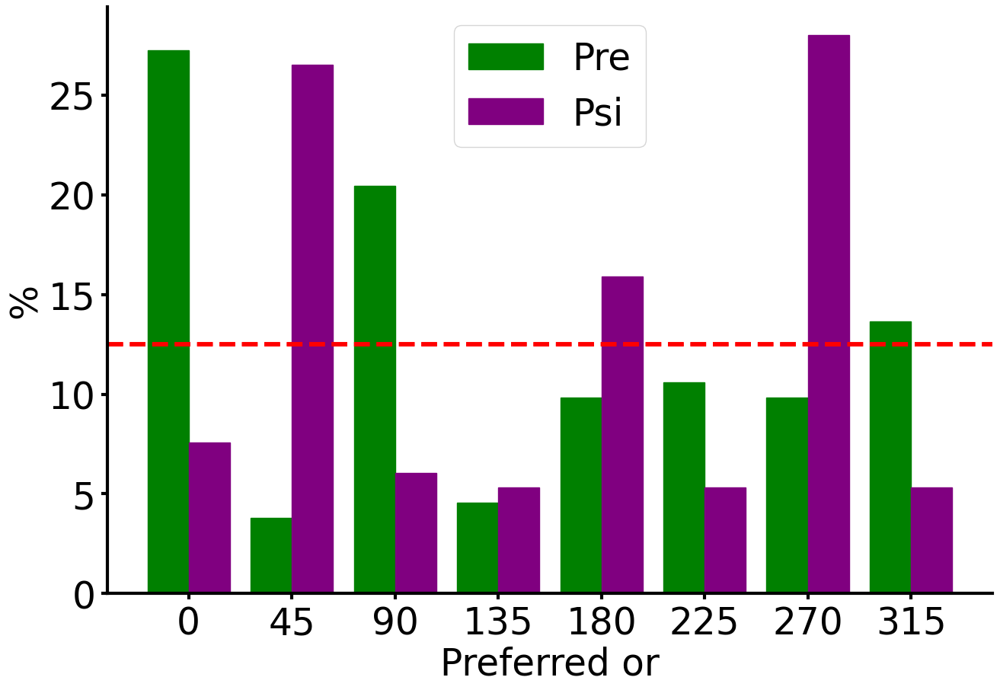

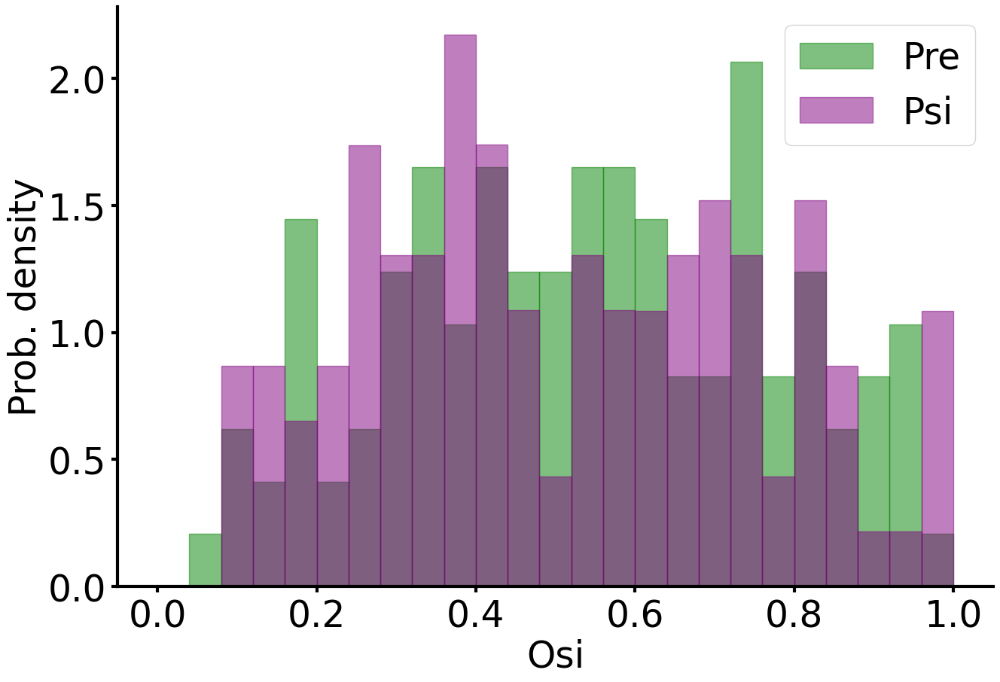

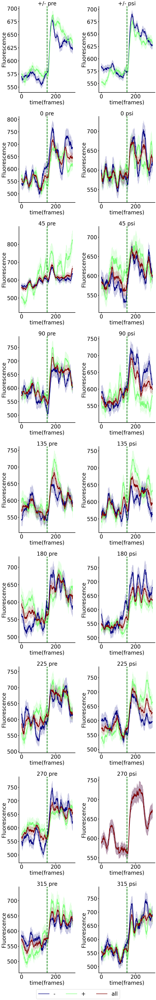

In [1]:
from scripts.run_analysis import main
#stim_data, recording = main()
stim_data, recording = main()
#stim_on = stim_data.get_recording(stim_name= 'final gray', phys_rec=recording, stim_time=150)

In [2]:

rec = stim_data.get_recording(stim_name = 'stim', phys_rec = recording, cond = 'pre',
            stim_time = None, get_pre_stim = False, latency=0)

In [3]:
import numpy as np


correlation_matrix = np.corrcoef(rec)
correlation_matrix.shape

: 

In [ ]:
r_pre = stim_data.get_recording(stim_name= 'gray', phys_rec=recording, ld_id='pre')
r_post = stim_data.get_recording(stim_name= 'gray', phys_rec=recording, ld_id='psilo')

import numpy as np
r = np.hstack([r_pre,r_post])
from sklearn.decomposition import PCA
pca = PCA(n_components=r.shape[0])
data_pca = pca.fit_transform(recording.T)
np.cumsum(pca.explained_variance_ratio_)

In [3]:
from collections import defaultdict


d = defaultdict(dict)
if d:
    print('ciao')
else:
    print('nano cacciatore')

nano cacciatore


In [13]:
np.where(np.cumsum(pca.explained_variance_ratio_)>0.95)[0]

array([227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239,
       240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252,
       253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265,
       266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278,
       279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291,
       292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304,
       305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317,
       318, 319, 320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330,
       331, 332, 333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343,
       344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356,
       357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369,
       370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382,
       383, 384, 385], dtype=int64)